In [232]:
import pandas as pd
import scanpy as sc
import numpy as np
import pickle
import gc

from collections import defaultdict

import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sb
import upsetplot as usp
from matplotlib.patches import Patch
import venn 
from adjustText import adjust_text
from matplotlib.lines import Line2D

from sklearn.preprocessing import minmax_scale,maxabs_scale

import diffxpy.api as de
from diffxpy.testing.det import DifferentialExpressionTestWald

from statsmodels.stats.multitest import multipletests

from scipy.cluster.hierarchy import linkage,dendrogram,fcluster,leaves_list
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist

import sys
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/diabetes_analysis/')
import helper as h
import importlib
importlib.reload(h)
import helper as h
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/diabetes_analysis/data_exploration/')
import helper_diffxpy as hde
importlib.reload(hde)
import helper_diffxpy as hde

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
pandas2ri.activate()
%load_ext rpy2.ipython

import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

from rpy2.robjects.packages import importr
grdevices = importr('grDevices')

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [2]:
%%R
library('ComplexHeatmap')
library(viridis)
library(proxy)
library(seriation)
library(dendextend)

In [3]:
ro.r('library(edgeR)')
ro.r('library("hypeR")')
ro.r("source(paste(Sys.getenv('WSCL'),'diabetes_analysis/data_exploration/','helper_hypeR.R',sep=''))")

value,[RTYPES.CLOSXP]
visible,[RTYPES.LGLSXP]


In [77]:
path_data='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/'
path_save_r='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/celltypes/'
path_fig='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/figures/paper/'
path_genes='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/'

In [5]:
# Load adata (for DE)
adata_full=sc.read(path_data+'data_integrated_analysed.h5ad')

In [46]:
# Load var only
var=sc.read(path_data+'data_integrated_analysed.h5ad',backed='r').raw.var.copy()

In [ ]:
# Load rawnorm (for plottting). Correctly norm expression is in layers X_sf_integrated
adata_rn=sc.read(path_data+'data_rawnorm_integrated_annotated.h5ad')
adata_rn.X=adata_rn.layers['X_sf_integrated']

#### Make pseudobulk
Make pseudobulk per sample, sex, and ct, excluding: embryo (study and cts (cell types)), multiplets, proliferative - mixed endocrine cts as we did not resolve them, low quality cluster (but not removed on level of subtypes). 

In [6]:
# Keep specified cts
cts=['acinar', 'alpha','beta', 'delta', 'ductal', 'endothelial', 'gamma', 'immune',
 'schwann','stellate_activated', 'stellate_quiescent']
adata=adata_full[adata_full.obs.cell_type_integrated_v1.isin(cts),:]
# Remove embryo
adata=adata[adata.obs.study!='embryo',:]
adata.shape

(252336, 13999)

Normalize data for pseudobulk DE

In [7]:
# Normalise
adata_norm=h.get_rawnormalised(adata.raw.to_adata(),sf_col='size_factors_integrated',
                               use_log=False,use_raw=False,copy=False)

Pseudobulk: sample-ct-sex

In [8]:
# Creat pseudobulk 
xs=[]
obss=[]
min_cells=20
for group,data in adata_norm.obs.groupby([
    'study','cell_type_integrated_v1','sex','study_sample_design']):
    if data.shape[0]>=min_cells:
        xs.append(np.array(adata_norm[data.index,:].X.sum(axis=0)).ravel())
        # Make obs
        # make sure obss is str not int if clusters
        obs={'study':str(group[0]),'cell_type':str(group[1]),
            'sex':str(group[2]),'sample':str(group[3])}
        obss.append(obs)
xs=pd.DataFrame(np.array(xs),columns=adata_norm.var_names)
obss=pd.DataFrame(obss)

In [9]:
print('xs',xs.shape)
print('obss',obss.shape)

xs (421, 30672)
obss (421, 4)


#### DE

In [10]:
group='cell_type'

In [11]:
%%R -i xs -i obss -i group
# Creat object
y<-DGEList(counts = t(xs),  samples = obss)
print(dim(y))

[1] 30672   421


In [12]:
%%R
# remove lowly expressed genes
keep <- filterByExpr(y, group=y$samples[,group])
y<-y[keep, , keep.lib.sizes=FALSE]
print(dim(y))

[1] 15983   421


In [13]:
%%R
# Effective library size
y <- calcNormFactors(y)

In [14]:
# Build design matrix
dmat_loc=pd.DataFrame(index=obss.index)
dmat_loc['Intercept']=1


condition='cell_type'
for val_idx,val in enumerate(sorted(obss[condition].unique())):
    # Do not add ct factor immune (intercept - as then getting DE results is 
    # easier if this not one of cts to be analyses)
    if val!='immune':
        dmat_loc.loc[obss[condition]==val,condition+'_'+str(val)]=1

condition='sex'
for val_idx,val in enumerate(
    sorted([cl for cl in obss[condition].unique() if cl!='male'])):
    dmat_loc.loc[obss[condition]==val,condition+'_'+str(val)]=1

condition='sample'
for val_idx,val in enumerate(
    sorted([cl for cl in obss[condition].unique() if cl!='STZ_G1_control'])):
    dmat_loc.loc[obss[condition]==val,condition+'_'+str(val)]=1

dmat_loc.fillna(0,inplace=True)
dmat_loc=dmat_loc.astype('float')

print('dmat_loc')
display(dmat_loc)

dmat_loc


,Intercept,cell_type_acinar,cell_type_alpha,cell_type_beta,cell_type_delta,cell_type_ductal,cell_type_endothelial,cell_type_gamma,cell_type_schwann,cell_type_stellate_activated,...,sample_spikein_drug_SRR10751507_A1_r2,sample_spikein_drug_SRR10751508_A10_r2,sample_spikein_drug_SRR10751509_DMSO_r2,sample_spikein_drug_SRR10751510_FOXO_r2,sample_spikein_drug_SRR10751511_GABA_r2,sample_spikein_drug_SRR10751512_A1_r3,sample_spikein_drug_SRR10751513_A10_r3,sample_spikein_drug_SRR10751514_DMSO_r3,sample_spikein_drug_SRR10751515_FOXO_r3,sample_spikein_drug_SRR10751516_GABA_r3
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
417,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
418,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
419,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
# Add design to R and name rows
ro.globalenv['design']=dmat_loc
ro.r('row.names(design)<-row.names(y$samples)')
ro.r('design')

,Intercept,cell_type_acinar,cell_type_alpha,cell_type_beta,cell_type_delta,cell_type_ductal,cell_type_endothelial,cell_type_gamma,cell_type_schwann,cell_type_stellate_activated,...,sample_spikein_drug_SRR10751507_A1_r2,sample_spikein_drug_SRR10751508_A10_r2,sample_spikein_drug_SRR10751509_DMSO_r2,sample_spikein_drug_SRR10751510_FOXO_r2,sample_spikein_drug_SRR10751511_GABA_r2,sample_spikein_drug_SRR10751512_A1_r3,sample_spikein_drug_SRR10751513_A10_r3,sample_spikein_drug_SRR10751514_DMSO_r3,sample_spikein_drug_SRR10751515_FOXO_r3,sample_spikein_drug_SRR10751516_GABA_r3
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
417,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
418,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
419,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot:>

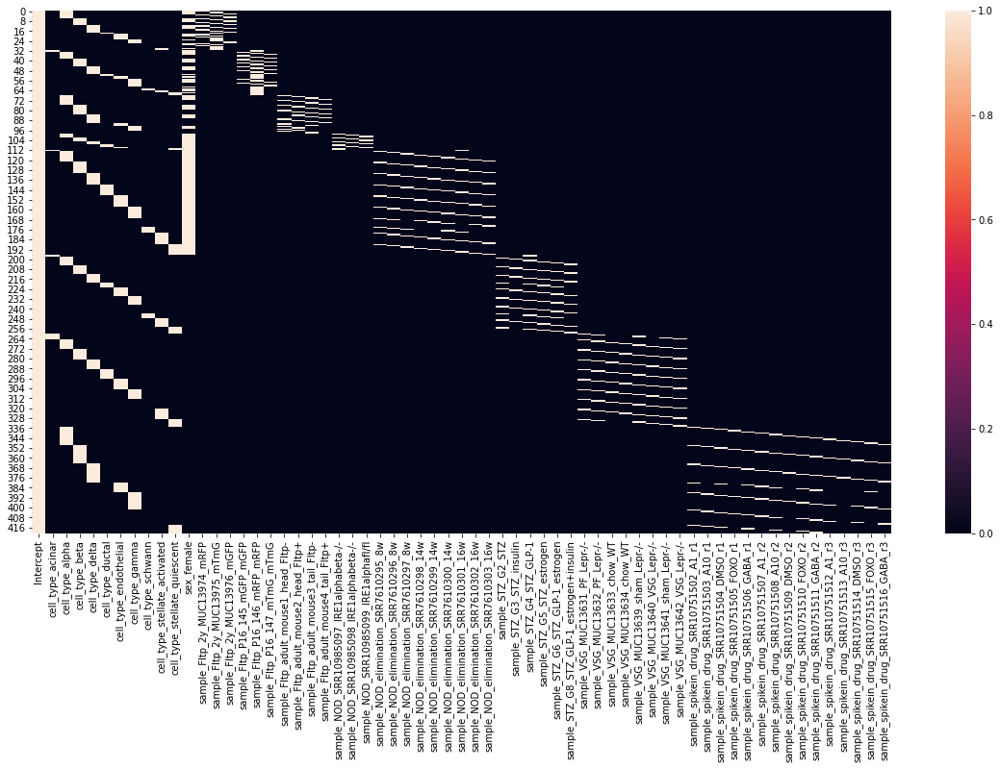

In [16]:
rcParams['figure.figsize']=(20,10)
sb.heatmap(dmat_loc,xticklabels=True)

In [96]:
%%R
# Robust dispersion 
y <- estimateGLMRobustDisp(y, design)

In [ ]:
print(1)

In [97]:
%%R
# Fit - GLM not QL as used robust dispersion
fit <- glmFit(y, design)

In [98]:
%R fit$design

array([[1., 0., 1., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [20]:
# Get DE tables - each endo ct to all other cts
summaries={}
for ct_test in ['alpha','beta','gamma','delta']:
    summaries_ct={}
    for ct_ref in [c for c in obss.cell_type.unique() if c!=ct_test]:
        # Coef2 in python indexing format
        coef2=np.argwhere(dmat_loc.columns=='cell_type_'+ct_test)[0][0]
        # Coef 1 is not needed if not existing as then testing signif of coef2 only 
        # (compared to intercept, should not be added explicitly!!!)
        # If coef1 is present then compare coef1 and coef2
        coef1=np.argwhere(dmat_loc.columns=='cell_type_'+ct_ref)
        if len(coef1)>0:
            coef1=coef1[0][0]
            contrast=np.zeros(dmat_loc.shape[1])
            contrast[coef1]=-1
            contrast[coef2]=1
            print('ct_test',ct_test,'ct_ref',ct_ref,'coef1',coef1,'coef2',coef2)
            print('Constrast',contrast)
            ro.globalenv['contrast']=contrast
            res=ro.r('glmLRT(fit, contrast=contrast)$table')
        else:
            print('ct_test',ct_test,'ct_ref',ct_ref,'coef2',coef2)
            coef2=coef2+1
            # Coef2 in R indexing format
            print('coef2 R',coef2)
            ro.globalenv['coef2']=coef2
            res=ro.r('glmLRT(fit, coef=coef2)$table')
        # Add padj
        res['padj']=multipletests(res["PValue"].values, alpha=0.05, method='fdr_bh')[1]
        summaries_ct[ct_ref]=res
    summaries[ct_test]=summaries_ct

ct_test alpha ct_ref beta coef1 3 coef2 2
Constrast [ 0.  0.  1. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test alpha ct_ref delta coef1 4 coef2 2
Constrast [ 0.  0.  1.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test alpha ct_ref ductal coef1 5 coef2 2
Constrast [ 0.  0.  1.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test alpha ct_ref endothelial coef1 6 coef2 2
Constrast [ 0.  0.  1

ct_test gamma ct_ref stellate_quiescent coef1 10 coef2 7
Constrast [ 0.  0.  0.  0.  0.  0.  0.  1.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test delta ct_ref alpha coef1 2 coef2 4
Constrast [ 0.  0. -1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test delta ct_ref beta coef1 3 coef2 4
Constrast [ 0.  0.  0. -1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test delta ct_ref ductal coef1 5 coef2 4
Constrast [ 0

#### Save

In [187]:
file=path_save_r+'DEedgeR_'
file

'/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/celltypes/DEedgeR_'

In [101]:
%%R -i file
# Save fits
save(y,fit,file=paste0(file,'fits.RData'))

In [19]:
#%%R -i file
# Reload
#load(file=paste0(file,'fits.RData'))

In [21]:
# Save summary tables
pickle.dump(summaries,open(file+'endo_summaries.pkl','wb'))

In [7]:
# Reload results
#summaries=pickle.load(open(file+'endo_summaries.pkl','rb'))

## Analyse DE

In [69]:
# Collect DE datas for single ct
# Test ct is compared against all otehr ref cts
cts_test=summaries.keys()
de_datas=defaultdict(list)
for ct_test,summaries_sub in summaries.items():
    for ct_ref,res in summaries_sub.items():
        de_data=res.copy()
        de_data['ct_test']=ct_test
        de_data['ct_ref']=ct_ref
        de_datas[ct_test].append(de_data)
for ct,de_data in de_datas.items():
    de_datas[ct]=pd.concat(de_data,axis=0)
    
# Find significant genes (against all cts) and min lfc across compared cts
LFC=1
PADJ=0.05
de_res={}
for ct,de_data in de_datas.items():
    # Find signif comparisons
    n_cts_ref=de_data['ct_ref'].nunique()
    de_data_signif=de_data.query('padj<@PADJ & logFC>@LFC'
                         ).reset_index().rename({'index':'gene'},axis=1).groupby('gene')
    de_genes=pd.DataFrame(de_data_signif.size().rename('n')).query('n==@n_cts_ref').index
    # Min lfc across comparisons
    de_data=de_data['logFC'].reset_index().rename({'index':'gene'},axis=1).\
        groupby('gene').min().loc[de_genes,:]
    de_res[ct]=de_data
    print(ct,'N genes:',de_data.shape[0])

alpha N genes: 77
beta N genes: 203
gamma N genes: 20
delta N genes: 197


Visualise selected genes with lowest LFC at different LFC thresholds to determine where the cut should be made to still get good markers

alpha


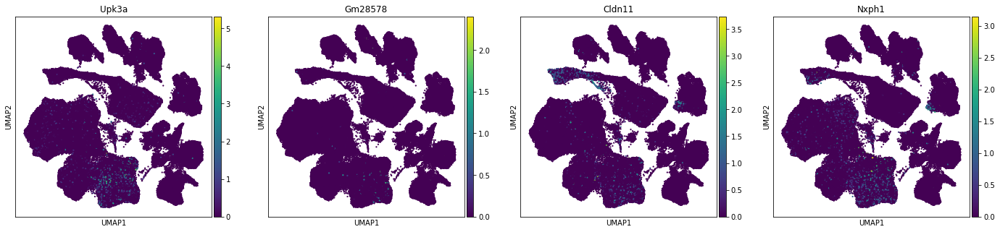

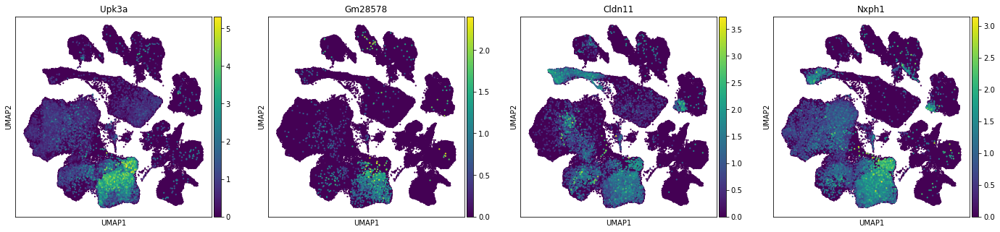

beta


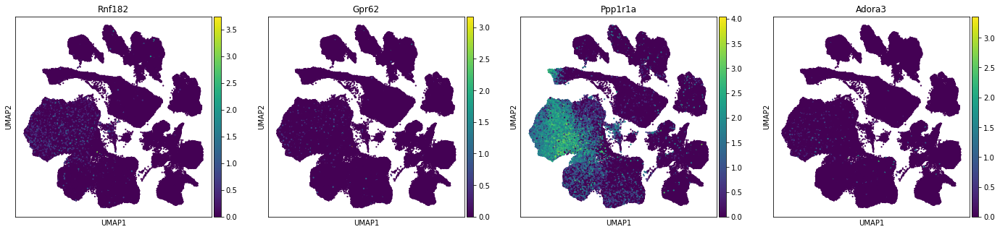

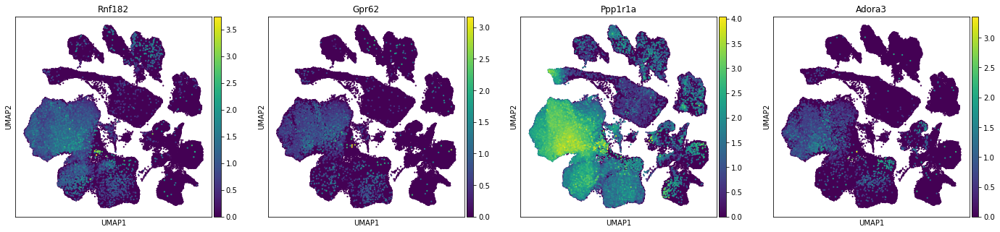

gamma


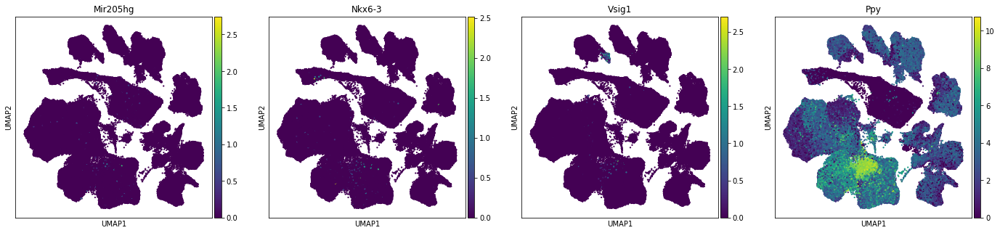

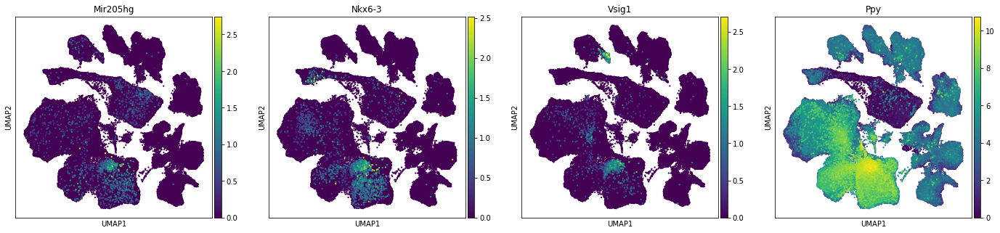

delta


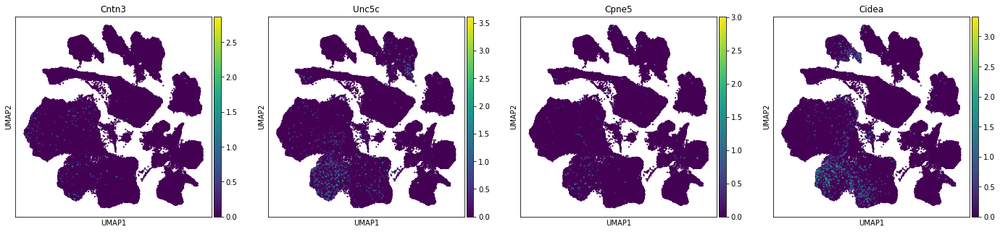

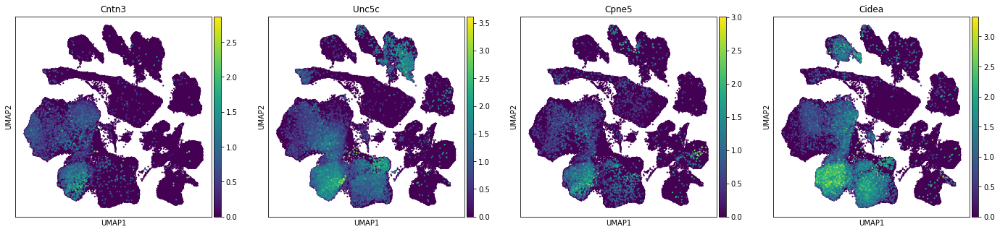

In [70]:
# At lFC=2
# Plot lowest lFC genes to make sure lFC thr is ok
for ct,de in de_res.items():
    print(ct)
    rcParams['figure.figsize']=(5,5)
    genes=var.loc[de.sort_values('logFC').query('logFC>2').head(4).index,'gene_symbol'].to_list()
    random_indices=np.random.permutation(list(range(adata_rn.shape[0])))
    sc.pl.umap(adata_rn[random_indices,:],color=genes,gene_symbols='gene_symbol',
               s=20,sort_order=False)
    sc.pl.umap(adata_rn,color=genes,gene_symbols='gene_symbol',
               s=20)

alpha


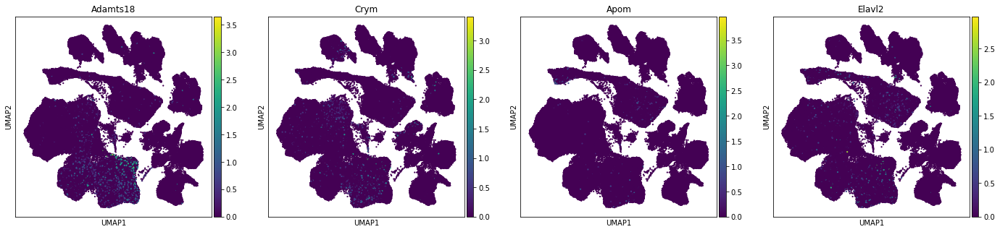

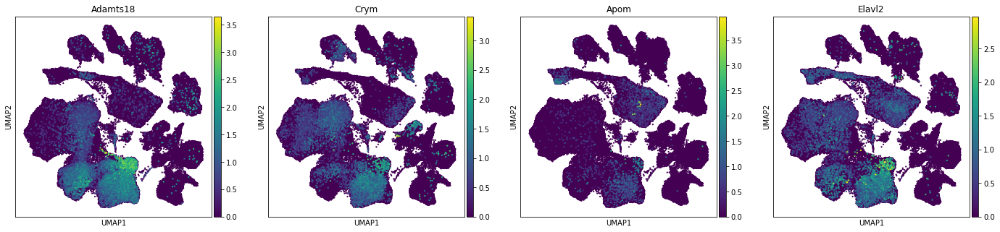

beta


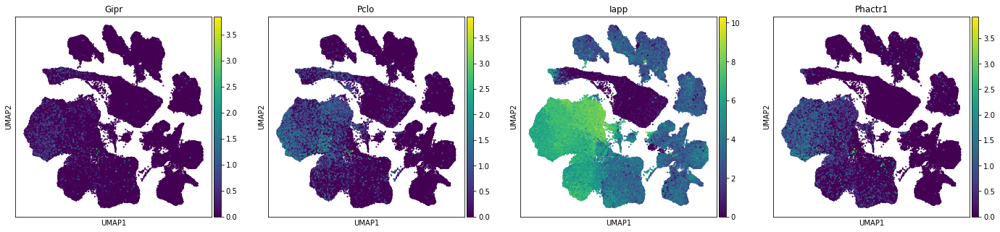

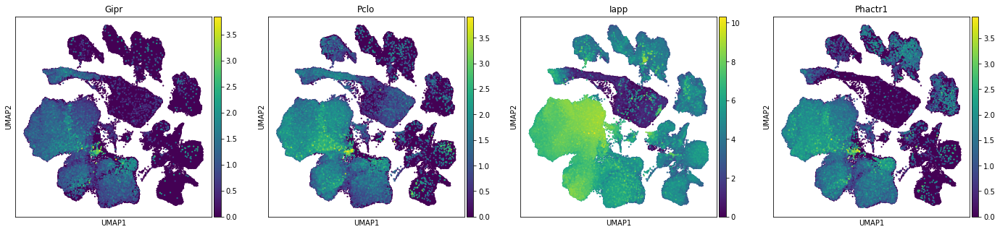

gamma


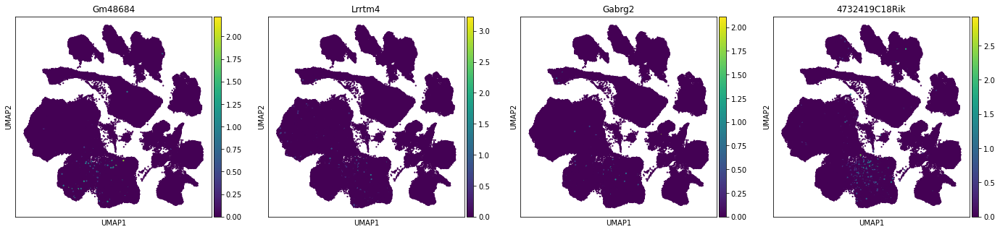

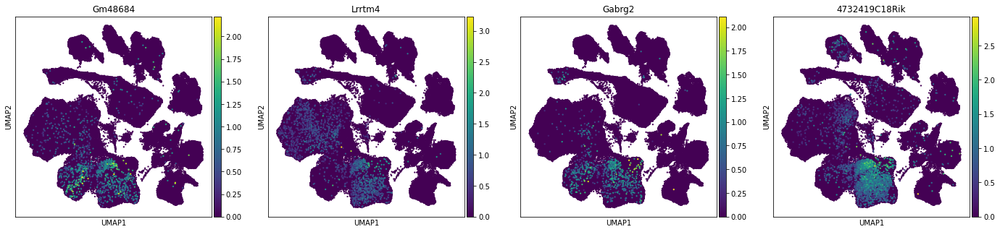

delta


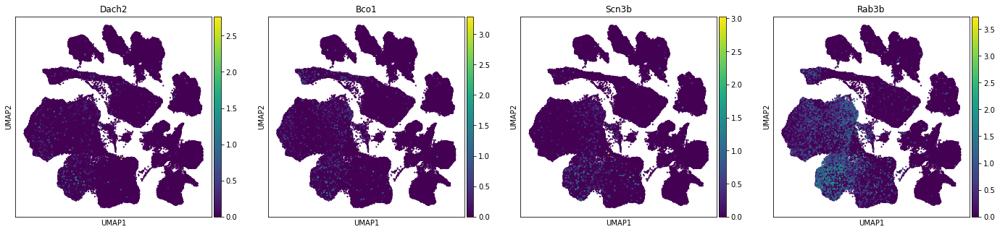

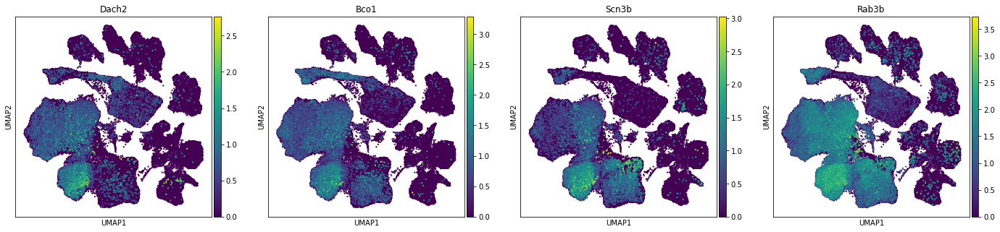

In [68]:
# At lFC=1.5
# Plot lowest lFC genes to make sure lFC thr is ok
for ct,de in de_res.items():
    print(ct)
    rcParams['figure.figsize']=(5,5)
    genes=var.loc[de.sort_values('logFC').query('logFC>1.5').head(4).index,'gene_symbol'].to_list()
    random_indices=np.random.permutation(list(range(adata_rn.shape[0])))
    sc.pl.umap(adata_rn[random_indices,:],color=genes,gene_symbols='gene_symbol',
               s=20,sort_order=False)
    sc.pl.umap(adata_rn,color=genes,gene_symbols='gene_symbol',
               s=20)

alpha


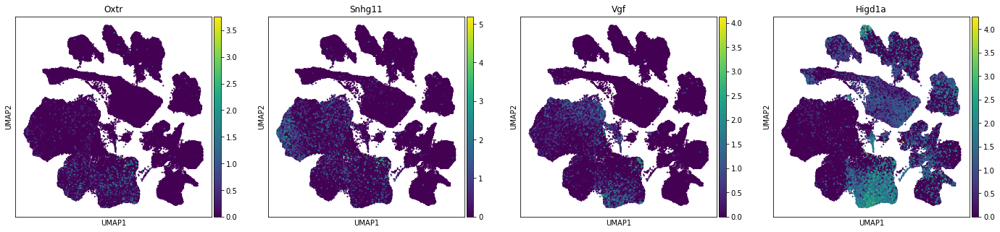

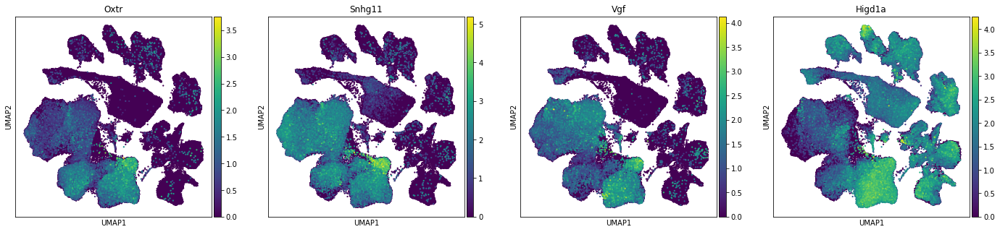

beta


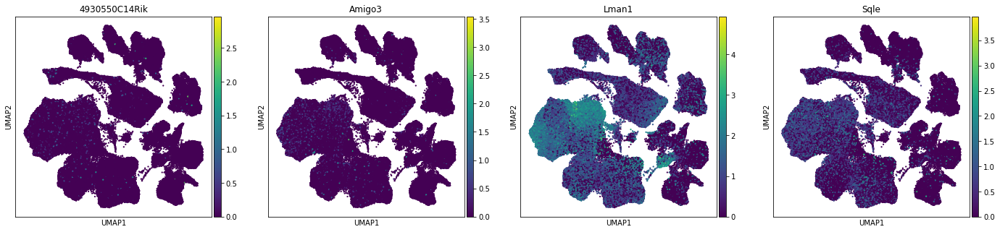

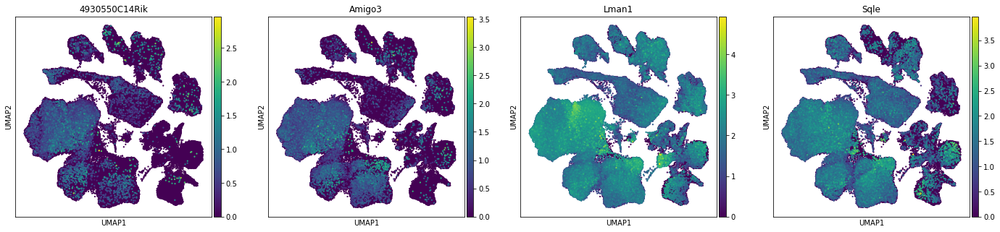

gamma


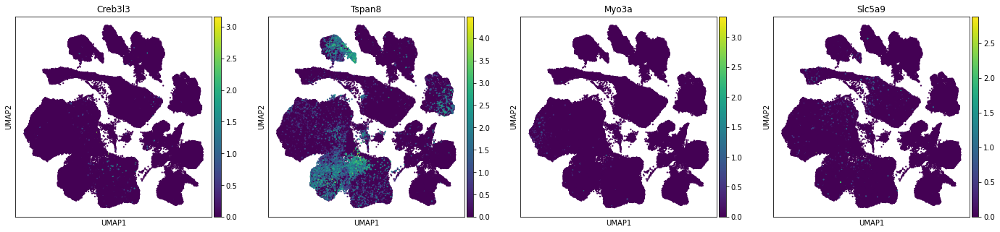

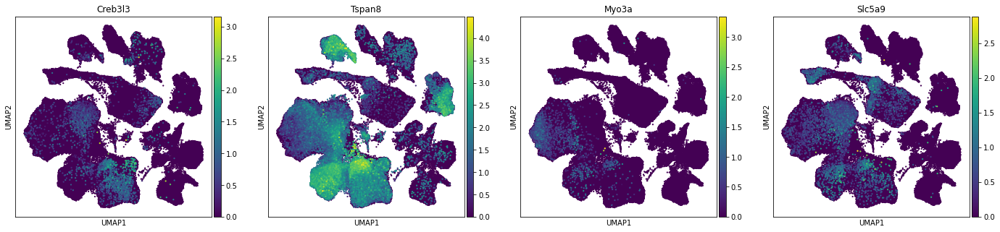

delta


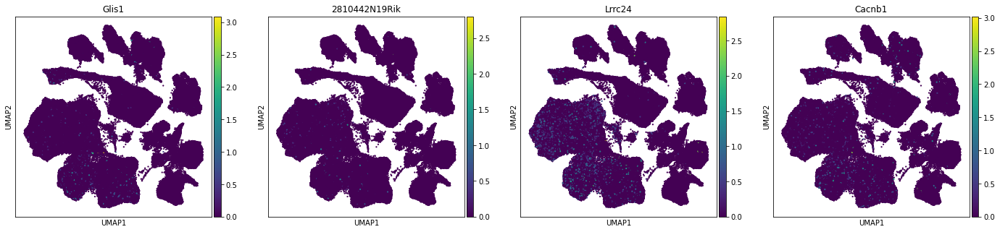

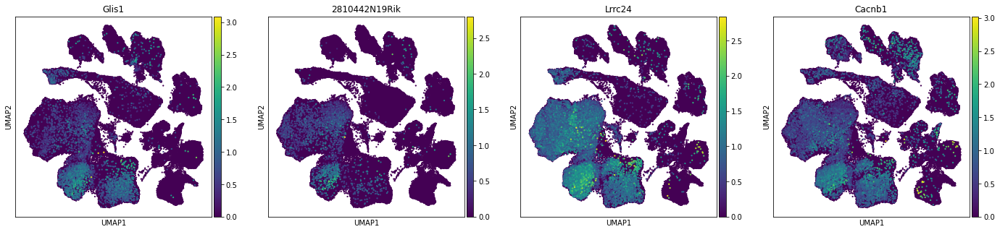

In [71]:
# At lFC=1
# Plot lowest lFC genes to make sure lFC thr is ok
for ct,de in de_res.items():
    print(ct)
    rcParams['figure.figsize']=(5,5)
    genes=var.loc[de.sort_values('logFC').query('logFC>1').head(4).index,'gene_symbol'].to_list()
    random_indices=np.random.permutation(list(range(adata_rn.shape[0])))
    sc.pl.umap(adata_rn[random_indices,:],color=genes,gene_symbols='gene_symbol',
               s=20,sort_order=False)
    sc.pl.umap(adata_rn,color=genes,gene_symbols='gene_symbol',
               s=20)

C: Low lFC genes may be not specific enough - expressed elsewhere or only in part of the cells. In general, lFC=1 thr is probably too low.

In [75]:
# Select lFC threshold
LFC_thr=1.5

In [184]:
# Print markers sorted by lFC
for ct,de, in de_res.items():
    print(ct)
    genes=var.loc[de.sort_values('logFC',ascending=False).query('logFC>@LFC_thr').index,
                  'gene_symbol'].to_list()
    print(len(genes))
    print(genes)

alpha
46
['Adarb2', 'Gcg', 'Irx1', 'Hhatl', 'Kcnc4', 'Rnf212b', 'Ttr', 'Gm648', 'Mas1', 'Lrrtm3', 'Wnk3', 'Vwde', 'Tmsb15b2', 'Sstr2', 'Cryba2', 'Irx2', 'Nxph1', 'Cldn11', 'Gm28578', 'Upk3a', 'Gm46560', 'Mafb', 'Tmsb15l', 'Ptprd', 'Rorb', 'Map3k15', 'Pou3f4', 'Mamld1', 'C8b', 'Frrs1l', 'Kcnq2', '3930402G23Rik', 'Minar1', 'Abcc12', 'Slc38a5', 'Ttbk1', 'Tmsb15b1', 'Gm15418', 'Pdzrn4', 'Gm20554', 'Slc7a2', 'Aard', 'Elavl2', 'Apom', 'Crym', 'Adamts18']
beta
118
['Prlr', 'Ucn3', 'Gm27168', 'Trpm5', 'Asb9', 'Mafa', 'Mnx1', 'Vstm2a', 'Tmem215', 'Prss53', 'Gpr158', 'Gm49542', 'Car10', 'Ins1', '2410021H03Rik', 'B830017H08Rik', 'Gm6999', 'Ins2', 'Gm4791', 'Slco1a6', 'Car15', 'Olfr1322', 'G6pc2', 'Gm17767', 'Crb1', 'Sytl4', 'Tmigd3', 'Rims3', 'Fer1l6', 'Csn3', 'Gad1', 'Fam151a', 'Cox6a2', 'Gm11789', 'Sgcz', 'Papss2', 'Gabbr2', 'Gm30173', 'Cnnm1', 'C78859', 'Hapln4', 'Ica1l', 'Slc5a10', 'nan', 'Tmprss4', 'Aqp4', 'Ush2a', 'Fkbp1b', 'Gpr45', 'Tgm3', 'Glp1r', 'Plut', 'Pcsk1', '4933432K03Rik', 'Zc3h3'

C: Some markers at the end of lists may not be as specific (e.g. for gamma)

alpha


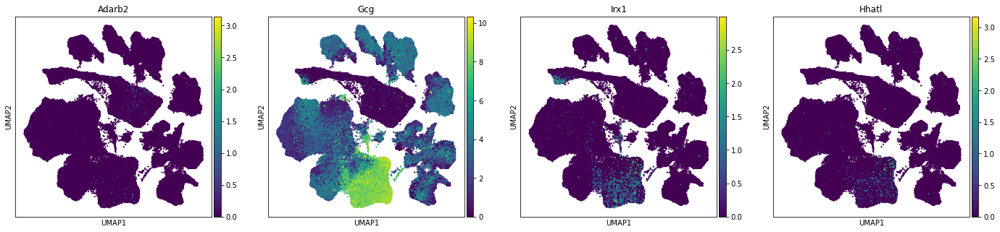

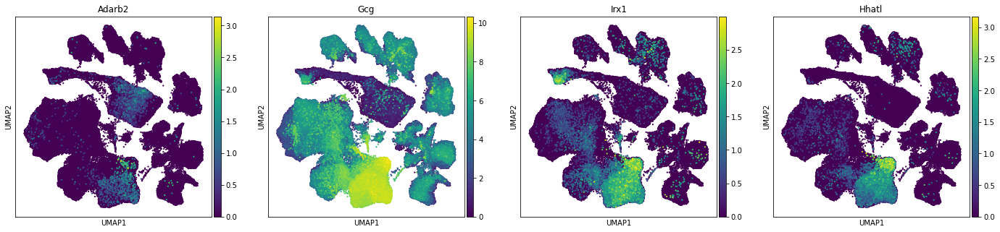

beta


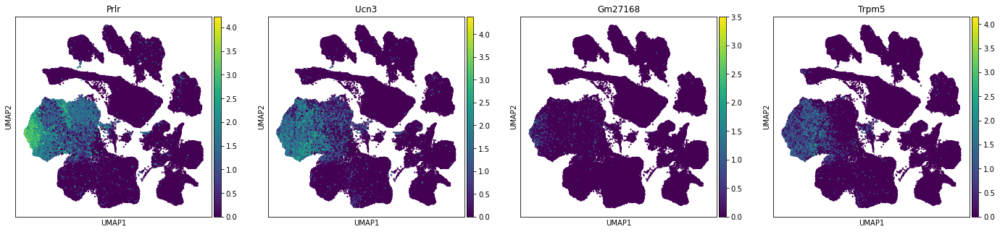

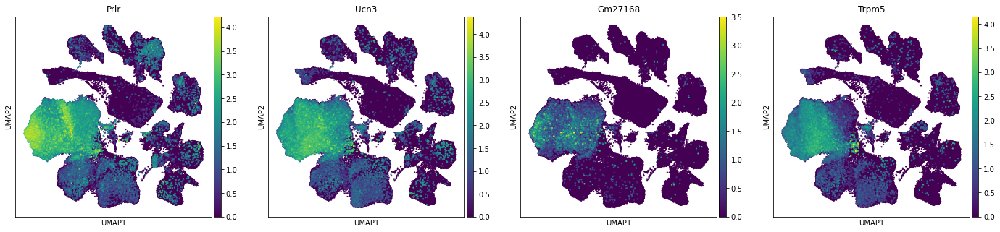

gamma


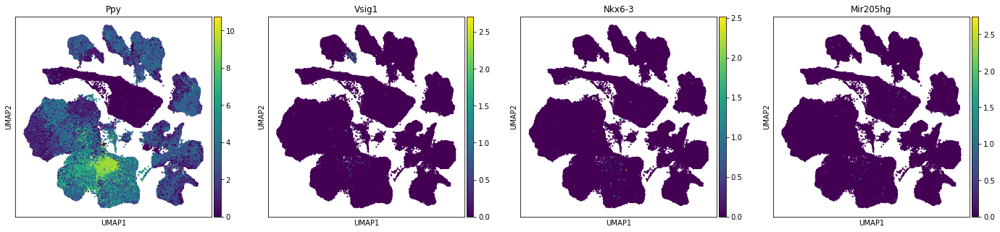

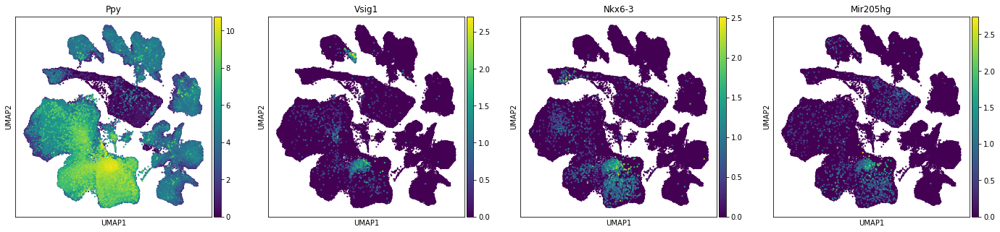

delta


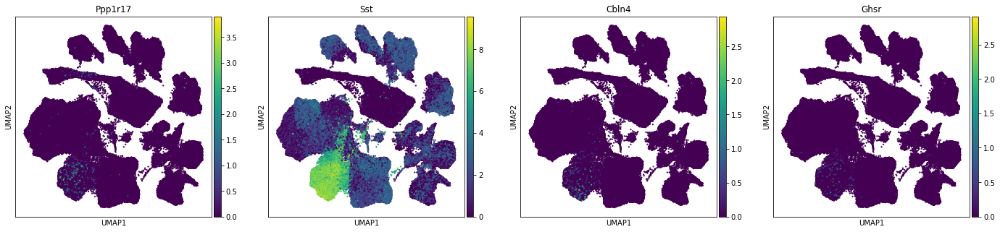

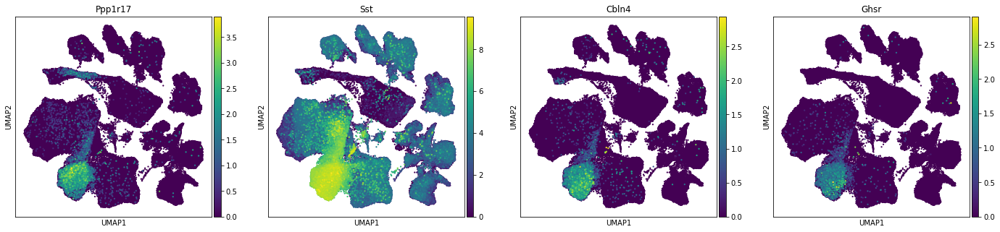

In [76]:
# Plot top markers
for ct,de in de_res.items():
    print(ct)
    rcParams['figure.figsize']=(5,5)
    genes=var.loc[de.sort_values('logFC',ascending=False).query('logFC>@LFC_thr').head(4).index,'gene_symbol'].to_list()
    random_indices=np.random.permutation(list(range(adata_rn.shape[0])))
    sc.pl.umap(adata_rn[random_indices,:],color=genes,gene_symbols='gene_symbol',
               s=20,sort_order=False)
    sc.pl.umap(adata_rn,color=genes,gene_symbols='gene_symbol',
               s=20)

C: top markers look ok although some may be a bit lowly expressed

#### Save
Report for all genes max padj and lFC as follows: if all LFC>0 report min, if all lFC<0 report max, if mixed signs report 0.

In [247]:
# Report max padj and parsed lfc
writer = pd.ExcelWriter(file+'summaries_ctParsed.xlsx',engine='xlsxwriter') 
for ct,de_data in de_datas.items():
    # Group by gene and compute min lFC and max padj across genes
    gene_data=de_data.reset_index().rename({'index':'gene'},axis=1).groupby('gene')
    de_summary=pd.concat([gene_data['logFC'].apply(
        lambda x: 0 if (x>0).any() and (x<0).any() else 
        (x.min() if (x>0).all() else x.max())),
                          gene_data['padj'].min()],axis=1
                        ).sort_values('logFC',ascending=False)
    de_summary['gene_symbol']=var.loc[de_summary.index,'gene_symbol']
    de_summary.to_excel(writer, sheet_name=str(ct))   
writer.save()

In [190]:
file+'summaries_ctParsed.xlsx'

'/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/celltypes/DEedgeR_summaries_ctParsed.xlsx'

## Compare to human markers

#### Load human data form the paper

In [78]:
# Find position of table for each ct in the excel sheet from the paper
cts=['ALPHA','BETA','DELTA','GAMMA']
header=pd.read_excel(path_save_r+'10_1038_s41467-022-29588-8_source_data.xlsx',
                     sheet_name='figure 1',nrows=1)
ct_icol_start={}
ct_icol_end={}
ct_previous=None
for idx,col in enumerate(header.columns):
    if ct_previous is not None:
        ct_icol_end[ct_previous]=idx-1
    if col in cts:
        ct_icol_start[col]=idx
        ct_previous=col
print('Starts',ct_icol_start,'Ends',ct_icol_end)

Starts {'ALPHA': 0, 'BETA': 16, 'GAMMA': 32, 'DELTA': 48} Ends {'ALPHA': 15, 'BETA': 31, 'GAMMA': 47, 'DELTA': 61}


In [79]:
# read markers
markers={}
for ct in cts:
    # read ct sheet subset
    m=pd.read_excel(path_save_r+'10_1038_s41467-022-29588-8_source_data.xlsx',
                     sheet_name='figure 1',usecols=range(ct_icol_start[ct],ct_icol_end[ct])
                   ).dropna(subset=[ct],axis=0)
    # Rename cols according to 2 line header
    col1_prev=None
    cols=[]
    for col1,col2 in zip(m.columns,m.iloc[0,:].values):
        if col1==ct:
            cols.append(col2)
        else:
            if not 'Unnamed' in col1:
                col1_prev=col1
            cols.append(col1_prev.replace(' ','_').replace('#','n')+'-'+col2)
    m.columns=cols
    # Subset to remove 2nd header row from data rows
    m=m.iloc[1:,:]
    # Result
    print(ct,m.shape)
    markers[ct]=m

ALPHA (862, 15)
BETA (1870, 15)
DELTA (647, 13)
GAMMA (795, 15)


Map to orthologues

In [169]:
# Orthologues
orthologues=pd.read_table(path_genes+'orthologues_ORGmus_musculus_ORG2homo_sapiens_V103.tsv'
                         ).rename(
    {'Gene name':'gs_mm','Human gene name':'gs_hs','Gene stable ID':'eid_mm',
    'Human gene stable ID':'eid_hs'},axis=1)
# Add Ppy as missing in this version of ortholgues
orthologues=orthologues.append({'eid_mm':'ENSMUSG00000017316','gs_mm':'Ppy', 
                    'eid_hs':'ENSG00000108849','gs_hs':'PPY'},ignore_index=True)

In [170]:
# Map to orthologues
markers_mm={}
for ct,markers_ct in markers.items():
    print(ct)
    markers_mm_ct=[]
    for idx,row in markers_ct.iterrows():
        gene=row['gene']
        for eid_mm in orthologues.query('gs_hs==@gene')['eid_mm']:
            row_mm=row.copy()
            row_mm['EID_mm']=eid_mm
            markers_mm_ct.append(row_mm)
    markers_mm[ct]=pd.DataFrame(markers_mm_ct)
    print("Succesfully maped human genes:",markers_mm[ct].gene.nunique(),
          'to N mouse genes:',markers_mm[ct].EID_mm.nunique(),
          'in N gene pairs:',markers_mm[ct].shape[0])

ALPHA
Succesfully maped human genes: 780 to N mouse genes: 821 in N gene pairs: 834
BETA
Succesfully maped human genes: 1670 to N mouse genes: 1720 in N gene pairs: 1729
DELTA
Succesfully maped human genes: 580 to N mouse genes: 615 in N gene pairs: 616
GAMMA
Succesfully maped human genes: 713 to N mouse genes: 763 in N gene pairs: 764


#### Mouse-human comparison

For each human marker orthologue retain smallest N datasets across ct comparisons (each endo ct was tested OvO against other endo cts) and where there are multiple human genes mapped to one mouse gene use the human gene with best/highest score as it is to be expected that there may be some non-functional orthologues.

In [171]:
# Min number of datasets where gene is marker across all ct comparisons
marker_scores={}
for ct,markers_mm_ct in markers_mm.items():
    marker_scores[ct]=pd.DataFrame(
        markers_mm_ct[[col for col in markers_mm_ct.columns 
                       if 'n_datasets' in col and 'vs' in col]
                     ].min(axis=1).values, index=markers_mm_ct["EID_mm"]
        ).groupby('EID_mm').max()

Mouse DE vulcano plot - max padj across cts and lFC across cts (if all lFC>0 use min, if all lFC<0 use max and if mixed lFC signs use 0), on it then color human markers by min N datasets where signif  across cts.

In [248]:
# Prepare data for vulcano plot
de_vulcano={}
for ct,de_data in de_datas.items():
    # Min lfc (based on abs) across comparisons
    de_group=de_data.reset_index().rename({'index':'gene'},axis=1).groupby('gene')
    de_vulcano[ct]=pd.concat([de_group['logFC'].apply(
        lambda x: 0 if (x>0).any() and (x<0).any() else 
        (x.min() if (x>0).all() else x.max())),
                              de_group['padj'].max()],axis=1)

In [249]:
# Are any padjs equal to 0? - if not can just do log
for ct,de in de_vulcano.items():
    print(ct,'any padj==0:', any(de.padj==0))

alpha any padj==0: False
beta any padj==0: False
gamma any padj==0: False
delta any padj==0: False


In [250]:
# make -log10padj for plotting
for ct,de in de_vulcano.items():
    de['-log10(padj)']=-np.log10(de.padj)

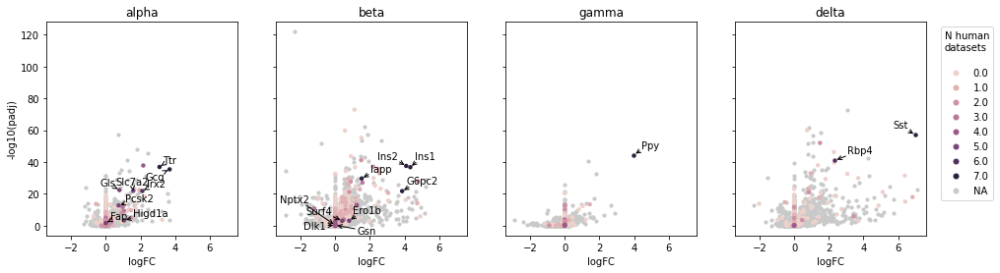

In [251]:
size=4
fig,axs=plt.subplots(1,len(de_vulcano),figsize=(size*len(de_vulcano),size),sharey=True,sharex=True)
legend_colors={}
for idx,ct in enumerate(de_vulcano):
    ax=axs[idx]
    base_color='#c9c9c9'
    genes_shared=set(de_vulcano[ct].index)&set(marker_scores[ct.upper()].index)
    genes_mouse=set(de_vulcano[ct].index)-genes_shared
    ax.scatter(x=de_vulcano[ct].loc[genes_mouse,'logFC'],
               y=de_vulcano[ct].loc[genes_mouse,'-log10(padj)'],c='#c9c9c9',s=10)
    # Min/max datasets based on the study info - to be consistent across plots
    min_datasets=0
    max_datasets=7
    for n_datasets in marker_scores[ct.upper()].loc[genes_shared,0].unique():
        sb.scatterplot(x=de_vulcano[ct].loc[genes_shared,'logFC'],
                   y=de_vulcano[ct].loc[genes_shared,'-log10(padj)'],
                   hue=marker_scores[ct.upper()].loc[genes_shared,:].\
                       rename({0:'n_datasets'},axis=1).\
                       query('n_datasets==@n_datasets')['n_datasets'],
                   ax=ax,linewidth=0,s=20, hue_norm=(min_datasets,max_datasets))
    ax.set_title(ct)
    hs,ls=ax.get_legend_handles_labels()
    for l,h in zip(ls,hs):
        legend_colors[l]=h.get_facecolor()
    ax.get_legend().remove()
    
    # Label genes also predicted as good markers in human
    texts = []
    for eid in marker_scores[ct.upper()].loc[genes_shared,:].rename({0:'n'},axis=1).\
                query('n>=5').index:
        gene_symbol=orthologues.query('eid_mm==@eid').gs_mm.to_list()[0]
        x=de_vulcano[ct].loc[eid,'logFC']
        y=de_vulcano[ct].loc[eid,'-log10(padj)']
        color_point='k'
        texts.append(ax.text(x, y, gene_symbol, color=color_point, fontsize=10))
    adjust_text(texts, expand_points=(2, 2),
        arrowprops=dict(arrowstyle="->",  color='k',  lw=1), ax=ax)
        
# make custom legend
legend_colors={k:legend_colors[k] for k in sorted(legend_colors)}
legend_elements =  [Line2D([0], [0], marker='o', color=c, lw=0, 
                          markerfacecolor=c, markersize=5,label=l) 
                    for l,c in legend_colors.items()]+[
                    Line2D([0], [0], marker='o', color=base_color, lw=0, 
                          markerfacecolor=base_color, markersize=5,label='NA')]
ax.legend(handles=legend_elements, bbox_to_anchor=(1.05,1),title='N human\ndatasets\n')

C: Seems that most robust human markers are also markers in mouse.

C: Note that some markers may be good when comapring to some cts but not others, thus geting overall low lFC